# Processing Data


In [1]:
# ruff: noqa: E402

%load_ext autoreload
%autoreload 2

# find the root of the project
import os
from pathlib import Path
import sys
import polars as pl
import dotenv


ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
sys.path.append(str(ROOT))


dotenv.load_dotenv(ROOT.joinpath(".env"))

from src.utils import check_gpu_available

GPU = check_gpu_available()
print(f"GPU available: {GPU}")

/home/max/Development/roadside-radar/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU available: True


## Load the Network


In [2]:
import geopandas as gpd
from src.geometry import RoadNetwork


mainline_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=["EBL1", "WBL1"],
    step_size=0.01,
)

full_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=None,
    step_size=0.01,
)

LANE_WIDTH = 3.55
LANE_NUM = 2

## Read in the Trajectories


In [3]:
from datetime import timedelta
import polars as pl
from src.radar import CalibratedRadar
from src.pipelines.open_file import prep_df


USE_FRONT = False


radar_obj = CalibratedRadar(
    radar_location_path=ROOT / "configuration" / "october_calibrated.yaml",
)


radar_df = (
    pl.scan_parquet(
        Path(os.environ.get("RAW_DATA_DIR")).joinpath("*.parquet"),
    )
    .with_columns(
        pl.col("epoch_time").dt.replace_time_zone("UTC"),
    )
    .filter(pl.col("epoch_time").dt.month() == 10)
    # .filter(
    #     pl.col("epoch_time").is_between(
    #         pl.lit("2023-03-13 06:50:00")
    #         .str.strptime(
    #             pl.Datetime(time_unit="ns", time_zone="US/Central"),
    #         )
    #         .dt.convert_time_zone("UTC"),
    #         pl.lit("2023-03-13 06:59:00")
    #         .str.strptime(
    #             pl.Datetime(time_unit="ns", time_zone="US/Central"),
    #         )
    #         .dt.convert_time_zone("UTC"),
    #     )
    # )
    .with_columns(
        (pl.col("f32_positionX_m") ** 2 + pl.col("f32_positionY_m") ** 2)
        .sqrt()
        .alias("dist"),
    )
    .filter(
        pl.when(pl.col("ip").is_in(["10.160.7.141", "10.160.7.137"]))
        .then(pl.col("dist") < 300)
        .otherwise(pl.lit(True))
    )
    # mark whether approaching or receding
    .collect()
    .lazy()
    .pipe(prep_df, f=radar_obj)
    .pipe(
        mainline_net.map_to_lane,
        dist_upper_bound=LANE_WIDTH * LANE_NUM
        - (LANE_WIDTH / 2)
        + 0.5,  # centered on one of the lanes,
        utm_x_col="utm_x",
        utm_y_col="utm_y",
    )
    .filter(pl.col("name").is_not_null())
    .rename(
        {
            "name": "lane",
            "angle": "heading_lane",
        }
    )
    .with_columns(
        (pl.col("dist").diff().backward_fill(1).over("object_id") < 0).alias(
            "approaching"
        )
    )
)

function: create_object_id took: 0.0002951622009277344 seconds
function: filter_short_trajectories took: 0.0004134178161621094 seconds
function: clip_trajectory_end took: 0.00021767616271972656 seconds
function: resample took: 0.0002446174621582031 seconds
function: fix_duplicate_positions took: 0.00015544891357421875 seconds
function: set_timezone took: 4.291534423828125e-05 seconds
function: add_cst_timezone took: 3.0994415283203125e-05 seconds
function: add_heading took: 2.9087066650390625e-05 seconds
function: rotate_radars took: 0.0006682872772216797 seconds
function: update_origin took: 0.0004868507385253906 seconds


In [4]:
from src.pipelines.kalman_filter import (
    prepare_frenet_measurement,
    build_extension,
    add_timedelta,
    build_kalman_id,
    filter_short_trajectories,
)

radar_df = (
    radar_df.pipe(
        filter_short_trajectories, minimum_distance_m=10, minimum_duration_s=2
    )
    .pipe(prepare_frenet_measurement)
    .pipe(build_extension, seconds=4)
    .pipe(add_timedelta)
    .pipe(build_kalman_id, split_time_delta=2)
    .collect()
)

function: filter_short_trajectories took: 0.2493147850036621 seconds
function: prepare_frenet_measurement took: 0.0008530616760253906 seconds
function: build_extension took: 2.9966983795166016 seconds
function: add_timedelta took: 0.00024700164794921875 seconds
function: build_kalman_id took: 0.0002148151397705078 seconds


In [5]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     radar_df
#     .with_columns((pl.col("s") + pl.col('distanceToFront_s')).alias("s"))
#     .pipe(radar_obj.add_cst_timezone)
#     .filter(
#     #     pl.col("epoch_time_cst").is_between(
#     #         pl.lit("2023-03-13 06:50:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #         pl.lit("2023-03-13 06:59:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #     )
#         (pl.col("lane").str.contains("E"))
#         # & (pl.col("lane_index") == 0)
#     )
#     .with_columns(
#         (pl.col('s').max() - pl.col('s')).alias('s'),
#     )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

In [6]:
# radar_df[["s", "s_velocity", "d", "d_velocity"]].describe()

In [7]:
from src.pipelines.kalman_filter import build_kalman_df

filter_df = (
    radar_df.with_columns((pl.col("distanceToFront_s") + pl.col("s")).alias("front_s"))
    .pipe(build_kalman_df, s_col="front_s" if USE_FRONT else "s")
    .filter(
        pl.col("max_time") < pl.col("max_time").max()  # filter out the outlier times
    )
    .collect()
)

function: build_kalman_df took: 0.0005998611450195312 seconds


### Loop through all the Trajectories and find the Trouble Ones


In [8]:
# from src.filters.vectorized_kalman import IMMFilter, CALCFilter, CVLKFilter
# import numpy as np


# for vehicle_id in filter_df["vehicle_ind"].unique():
#     veh_df = filter_df.filter(pl.col("vehicle_ind") == vehicle_id).with_columns(
#         pl.lit(0).alias("vehicle_ind")
#     )

#     IMMFilter(
#         df=veh_df.rename({"measurement": "z"}),
#         filters=("CALC", "CALK", "CVLK"),
#         M=np.array([[0.8, 0.1, 0.1], [0.1, 0.8, 0.1], [0.1, 0.1, 0.8]]),
#         mu=np.array([0.05, 0.3, 0.65]),
#         gpu=False,
#     ).apply_filter()

In [9]:
# radar_df.filter(pl.col("kalman_id") == veh_df["kalman_id"][0])

### IMM Filter the Radar Trajectories


In [10]:
filter_df.group_by("vehicle_ind").agg(pl.col("time_ind").max())["time_ind"].describe()

statistic,value
str,f64
"""count""",41564.0
"""null_count""",0.0
"""mean""",144.654629
"""std""",75.099766
"""min""",39.0
"""25%""",100.0
"""50%""",132.0
"""75%""",167.0
"""max""",889.0


In [11]:
# # gotta clip out some outlier trajectories
# filter_df = filter_df.filter(
#     pl.col("time_ind").max().over("vehicle_ind") < pl.col("time_ind").quantile(0.9995)
# )

In [12]:
from src.filters.vectorized_kalman import batch_imm_df
import numpy as np

# from src.filters.vectorized_kalman import batch_imm_df
# import numpy as np

# filt_df = batch_imm_df(
#     filter_df.rename({"measurement": "z"}),
#     filters=("CALC", "CALK", "CVLK"),
#     M=np.array([[0.7, 0.15, 0.15], [0.15, 0.7, 0.15], [0.15, 0.15, 0.7]]),
#     mu=np.array([0.25, 0.25, 0.5]),
#     # chunk_size=3_500,
#     chunk_size=800,
#     gpu=False,
# # )

filt_df = batch_imm_df(
    filter_df.rename({"measurement": "z"}),
    filters=("CALC", "CALK", "CVLK"),
    M=np.array([[0.9, 0.05, 0.05], [0.05, 0.9, 0.05], [0.05, 0.05, 0.9]]),
    mu=np.array([0.1, 0.5, 0.4]),
    # chunk_size=3_500,
    chunk_size=800 if not GPU else 15_000,
    gpu=GPU,
)


# filt_df = batch_imm_df(
#     filter_df.rename({"measurement": "z"}),
#     filters=(
#         "CALC",
#         "CALK",
#     ),
#     M=np.array(
#         [
#             [
#                 0.9,
#                 0.1,
#             ],
#             [
#                 0.1,
#                 0.9,
#             ],
#         ]
#     ),
#     mu=np.array([0.7, 0.3]),
#     # chunk_size=3_500,
#     chunk_size=800 if not GPU else 15_000,
#     gpu=GPU,
# )

100%|██████████| 3/3 [00:45<00:00, 15.09s/it]


In [13]:
from src.pipelines.kalman_filter import join_results

joined_df = join_results(filt_df, filter_df, radar_df)

if USE_FRONT:
    joined_df = joined_df.rename({"s": "front_s"})

joined_df = joined_df.collect()

function: join_results took: 0.0007944107055664062 seconds


## Plotting the Lanes


In [14]:
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(10, 5))

# joined_df.filter(pl.col("lane").str.contains("W") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

# ax.set_xlim(-5, 6)

(-5.0, 6.0)

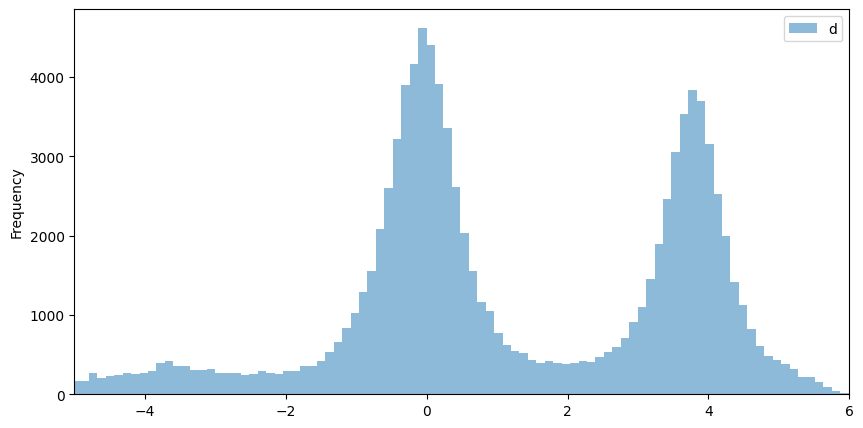

In [15]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

joined_df.filter(pl.col("lane").str.contains("E") & pl.col("d").is_between(-6, 6))[
    ["d"]
].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

ax.set_xlim(-5, 6)

### Classify the Lanes


In [16]:
from src.pipelines.lane_classification import label_lane, label_lanes_tree
from src.gmm.lane_classification import build_lane_model
from src.plotting.lane_gmm import plot_model

In [17]:
res = joined_df.pipe(
    label_lanes_tree,
    full_network=full_net,
    kalman_network=mainline_net,
    lane_width=LANE_WIDTH,
    s_col="front_s" if USE_FRONT else "s",
)


res.filter(pl.col("lane_index").is_null()).shape[0] / res.shape[0]

res = res.with_columns(pl.col("lane_index").fill_null(2))

/tmp/ipykernel_913049/915200866.py:7: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  ).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")


(-5.0, 6.0)

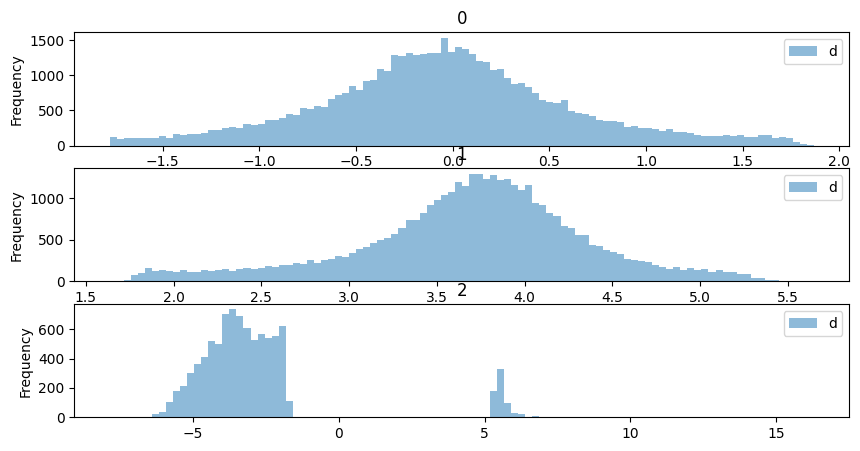

In [18]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

res.filter(pl.col("lane").str.contains("E"))[["d", "lane_index"]].sample(
    100_000
).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")

ax.set_xlim(-5, 6)

In [19]:
joined_df = res.filter(pl.col("lane_index") <= 1)

## Save the Kalman Filtered Trajectories

In [20]:
# (
#     joined_df
#     .pipe(
#         add_front_back_s,
#         use_nearest_length=True,
#     )
# )

In [21]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

save_df = (
    joined_df
    # .pipe(
    #     add_front_back_s,
    #     use_nearest_length=True,
    # )
    .select(
        [
            "epoch_time",
            "object_id",
            # # (pl.col("front_s") - pl.col('distanceToFront_s')).alias('centroid_s'),
            # (pl.col('front_s') + pl.col('distanceToFront_s')).alias("front_s"),
            # (pl.col('front_s') - pl.col('length_s')).alias("back_s"),
            # 'front_s',
            # 'back_s',
            pl.col("s").alias("centroid_s"),
            (pl.col("s") + pl.col("distanceToFront_s")).alias("front_s"),
            (pl.col("s") + pl.col("distanceToBack_s")).alias("back_s"),
            "s_velocity",
            "d",
            "d_velocity",
            "lane",
            "lane_index",
            "prediction",
            "missing_data",
        ]
    )
    
)



# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s", "d", "front_x", "front_y"),
    ("back_s", "d", "back_x", "back_y"),
    ("centroid_s", "d", "centroid_x", "centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    save_df = (
        save_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )

    
save_df.write_parquet(
    ROOT.joinpath("data", "october_kalman.parquet"),
    compression="gzip",
    row_group_size=100_000,
)

## Merge the Trajectories


In [28]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

joined_df = (
    joined_df.lazy().pipe(
        add_front_back_s, use_median_length=False, s_col="front_s" if USE_FRONT else "s"
    ).collect()
)


lf_df = (
    joined_df
    .lazy()
    .pipe(build_leader_follower_df, s_col="front_s" if USE_FRONT else "s")
    # only consider vehicles that are fairly close
    .filter(pl.col("s_gap") < 20)
    # don't keep matches that are both prediction
    .filter(~(pl.col("prediction") & pl.col("prediction_leader")))
    # .filter()
    # assumption that radar tracks perfectly
    .filter(pl.col("ip") != pl.col("ip_leader"))
    .filter(pl.col("s_velocity") > 5)
    .collect()
)

function: add_front_back_s took: 0.00020360946655273438 seconds
function: lazy_func took: 0.0008809566497802734 seconds


### Calculate the Association Log-Likelihood Distance


In [29]:
from src.pipelines.association import calc_assoc_liklihood_distance

lf_df = lf_df.pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=4)

function: lazy_func took: 0.817671537399292 seconds


### Calculate the Match Indexes


In [30]:
from scipy.stats import chi
from src.pipelines.association import (
    calculate_match_indexes,
    pipe_gate_headway_calc,
    build_match_df,
)

match_df = (
    lf_df.pipe(calculate_match_indexes, match_time_threshold=10)
    .pipe(pipe_gate_headway_calc, alpha=0.6)
    .pipe(
        build_match_df,
        traj_time_df=joined_df.group_by("object_id")
        .agg(
            pl.col("epoch_time").max().alias("epoch_time_max"),
        )
        .lazy(),
        assoc_cutoff=chi.ppf(0.975, 4),
        assoc_cutoff_pred=chi.ppf(0.95, 4),
    )
    .collect()
)

function: lazy_func took: 0.0006456375122070312 seconds
function: lazy_func took: 0.00012135505676269531 seconds
function: lazy_func took: 0.7439439296722412 seconds


In [25]:
# match_df.unnest('pair').filter(
#     pl.col("object_id").is_in(
#         assoc_df.filter(
#             pl.col('vehicle_id').is_in([3883, 3900])
#         )['object_id']
#     )
# )

### Re-Label the Joined Trajectories


In [31]:
from src.pipelines.association import create_vehicle_ids

assoc_df = joined_df.pipe(
    create_vehicle_ids,
    match_df,
)

function: lazy_func took: 0.33359217643737793 seconds


In [32]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 12:06:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 12:12:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="s",
    markers=True,
    fig=fig,
    every=10
)

fig.update_layout()


fig.show()

function: add_cst_timezone took: 0.00032806396484375 seconds


In [27]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     joined_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:09:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:12:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (~pl.col("prediction"))
#         # & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

## Fuse & Smooth the Trajectories


In [28]:
from src.pipelines.association import build_fusion_df

fusion_df = (
    assoc_df.pipe(build_fusion_df, prediction_length=3)
    .collect(streaming=True)
    .pipe(
        radar_obj.add_cst_timezone,
        time_col="epoch_time",
    )
)

fusion_df.head()

function: lazy_func took: 11.874593496322632 seconds
function: add_cst_timezone took: 0.0006799697875976562 seconds


s,s_velocity,s_accel,d,d_velocity,d_accel,P,P_CALK,mu_CALC,mu_CALK,mu_CVLK,kalman_id,epoch_time,time_diff,measurement,prediction,missing_data,max_time,angle_diff,approaching,classID,dist,distanceToBack_s,distanceToFront_s,epoch_time_cst,f32_directionX,f32_directionY,f32_distanceToBack_m,f32_distanceToFront_m,f32_length_m,f32_positionX_m,f32_positionY_m,f32_trackQuality,f32_velocityInDir_mps,f32_width_m,h3,heading,heading_lane,heading_utm,ip,lane,lane_index,lat,length_s,lon,object_id,rotated_x,rotated_y,row_nr,split,trajectory_id,ui16_ageCount,ui16_predictionCount,ui16_staticCount,ui32_objectID,utm_x,utm_y,x_lane,y_lane,s_lane,d_cutoff,d_other_center,front_s,back_s,vehicle_id,start_time,count,timedelta,time_index,vehicle_time_index_int
f32,f32,f32,f32,f32,f32,"array[f32, 36]","array[f32, 36]",f32,f32,f32,u64,"datetime[ms, UTC]",f64,"array[f32, 4]",bool,bool,u32,f64,bool,i32,f32,f64,f64,"datetime[ms, US/Central]",f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,u64,f32,f64,f64,str,str,u16,f64,f64,f64,u64,f64,f64,u32,bool,u32,i16,i16,i16,i32,f64,f64,f64,f64,f32,f64,f64,f64,f64,u64,"datetime[ms, UTC]",u32,i64,u32,u32
1011.151489,14.524792,0.0,-0.568413,-0.368551,0.0,"[1.543379, 7.8580e-12, … 2.0]","[1.543379, 0.0, … 2.0]",0.135,0.475,0.39,15832628025273130983,2023-10-31 15:26:09.200 UTC,0.0,"[1011.151489, 14.524793, … -0.368551]",false,false,98,-0.025369,false,30,186.869278,-1.313191,0.478275,2023-10-31 10:26:09.200 CDT,-0.627784,0.778387,-1.313613,0.478429,6.258079,-96.264832,160.166183,75.343529,14.529468,2.5,640723713329470127,2.2495,-2.877072,3.380745,"""10.160.7.141""","""WBL1""",0,33.234575,6.256065,-87.616268,6349779480890553639,-185.905118,-18.958145,2788260,false,0,359,0,3200,44441,442585.819359,3.6775e6,442585.9702,3.6775e6,1011.151489,1.821956,3.643911,1011.629765,1009.838299,1,2023-10-31 15:26:09.200 UTC,1,31600,0,0
805.348511,10.075262,0.0,-0.098605,0.000805,0.0,"[1.543379, 4.1797e-12, … 2.0]","[1.543379, 6.8519e-12, … 2.0]",0.135,0.475,0.39,3464554478622225773,2023-10-31 15:26:09.200 UTC,0.0,"[805.348511, 10.075262, … 0.000805]",false,false,80,0.00008,true,30,57.89983,-2.448139,2.021149,2023-10-31 10:26:09.200 CDT,0.646442,-0.762963,-2.448139,2.021149,5.505716,-29.837824,49.619499,74.301414,10.075262,2.5,640723713329533511,-0.867885,0.26328,0.26336,"""10.160.7.141""","""EBL1""",0,33.234665,5.505716,-87.614888,12336942168301519339,-57.599794,-5.886782,5911017,false,0,484,0,3200,44426,442714.124683,3.6775e6,442714.096321,3.6775e6,805.348511,1.749945,3.49989,807.36966,802.900372,5,2023-10-31 15:26:09.200 UTC,1,18100,0,0
548.679016,19.198833,0.0,0.260304,0.074718,0.0,"[1.543379, 6.5093e-12, … 2.0]","[1.543379, 1.3704e-11, … 2.0]",0.135,0.475,0.39,10493493998615493464,2023-10-31 15:26:09.200 UTC,0.0,"[548.679016, 19.198833, … 0.074718]",false,false,122,0.003892,false,30,102.178307,-2.694789,1.719733,2023-10-31 10:26:09.200 CDT,-0.709849,0.704354,-2.694809,1.719746,6.533916,-45.828762,91.324318,66.086319,19.198978,2.5,640723713329650703,2.36008,0.263114,6.550191,"""10.160.7.137""","""EBL1""",0,33.234035,6.533867,-87.617524,12332216070083834395,102.011359,-5.838582,5910051,false,0,87,0,6000,38072,442466.21688,3.6774e6,442466.280963,3.6774e6,548.679016,1.859996,3.719993,550.398749,545.984227,7,2023-10-31 15:26:09.200 UTC,1,47200,0,0
1112.751709,21.001863,0.0,4.366775,-0.82957,0.0,"[1.543379, 0.0, … 2.0]","[1.543379, 0.0, … 2.0]",0.135,0.475,0.39,3706544886385004233,2023-10-31 15:26:09.200 UTC,0.0,"[1112.751709, 21.001863, … -0.82957]",false,false,93,-0.039479,true,30,125.858704,-2.019783,-0.748402,2023-10-31 10:26:09.200 CDT,0.678453,-0.734644,-2.021358,-0.748986,1.991419,-76.494644,99.944901,71.502274,21.018242,2.5,640723713329630119,-0.825142,-2.878737,3.364969,"""10.160.7.137""","""WBL1""",1,33.234234,1.989867,-87.617277,1541733399785685114,124.780546,16.438646,436535,false,0,156,0,6000,38068,442488.986066,3.6774e6,442487.852907,3.6774e6,1112.751709,1.815729,3.631459,1112.003307,1110.731926,8,2023-10-31 15:26:09.200 UTC,1,18300,0,

In [29]:
distance_adjuster = (
    fusion_df.group_by(
        [
            "vehicle_id",
            "time_index",
        ]
    )
    .agg(
        pl.col("distanceToFront_s")
        .filter(pl.col("approaching"))
        .mean()
        .alias("distanceToFront_s"),
        pl.col("distanceToBack_s")
        .filter(~pl.col("approaching"))
        .mean()
        .alias("distanceToBack_s"),
        pl.col("distanceToFront_s").mean().alias("distanceToFront_s_all"),
        pl.col("distanceToBack_s").mean().alias("distanceToBack_s_all"),
    )
    .with_columns(
        pl.when(pl.col("distanceToFront_s").is_null())
        .then(pl.col("distanceToFront_s_all"))
        .otherwise(pl.col("distanceToFront_s"))
        .alias("distanceToFront_s"),
        pl.when(pl.col("distanceToBack_s").is_null())
        .then(pl.col("distanceToBack_s_all"))
        .otherwise(pl.col("distanceToBack_s"))
        .alias("distanceToBack_s"),
    )
    .drop(["distanceToFront_s_all", "distanceToBack_s_all"])
)

In [30]:
outer_df = (
    fusion_df.select(
        [
            "front_s",
            "s",
            "back_s",
            "s_velocity",
            "d",
            "d_velocity",
            "P",
            "vehicle_id",
            "time_index",
            "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .filter(~pl.col("prediction"))
)

outer_df = (
    (
        outer_df.join(
            outer_df,
            on=["time_index", "vehicle_id"],
            how="outer",
            suffix="_leader",
        )
    )
    .with_columns(
        pl.struct(
            [
                pl.min_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("one"),
                pl.max_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("two"),
            ]
        ).alias("vehicle_time_struct"),
    )
    # .collect()
    .filter(
        (
            pl.col("vehicle_time_index_int")
            .cum_count()
            .over(["vehicle_id", "time_index", "vehicle_time_struct"])
            < 1
        )
        & (pl.col("vehicle_time_index_int") != pl.col("vehicle_time_index_int_leader"))
    )
    .collect(streaming=True)
    .pipe(
        calc_assoc_liklihood_distance,
        gpu=GPU,
        dims=4,
    )
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("association_distance").max())
)

function: lazy_func took: 0.6568253040313721 seconds


In [31]:
from src.filters.fusion import batch_join, rts_smooth

GPU = True

merged_df = batch_join(
    fusion_df,
    method="ImprovedFastCI",
    batch_size=10_000 if not GPU else 10_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)
merged_df = rts_smooth(
    merged_df,
    batch_size=10_000 if not GPU else 50_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)

merged_df = (
    merged_df.lazy()
    .join(
        fusion_df.lazy()
        .select(["time_index", "vehicle_id", "object_id", "length_s"])
        .group_by(["time_index", "vehicle_id"])
        .agg(pl.col("object_id"), pl.col("length_s").mean()),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        outer_df.lazy().select(["time_index", "vehicle_id", "association_distance"]),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        distance_adjuster.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .with_columns(
        (pl.col("ci_s") + pl.col("distanceToFront_s")).alias("ci_front_s"),
        (pl.col("ci_s") + pl.col("distanceToBack_s")).alias("ci_back_s"),
        (pl.col("s_smooth") + pl.col("distanceToFront_s")).alias("front_s_smooth"),
        (pl.col("s_smooth") + pl.col("distanceToBack_s")).alias("back_s_smooth"),
    )
    .collect()
)

100%|██████████| 1379/1379 [00:16<00:00, 85.33it/s] 
/home/max/Development/roadside-radar/src/filters/fusion.py:753: UserWarning:

The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)

100%|██████████| 1379/1379 [00:04<00:00, 292.58it/s]


In [32]:
# merged_df = merged_df.with_columns(
#     (pl.col("front_s_smooth") - pl.col("length_s")).alias("back_s_smooth"),
#     (pl.col("ci_front_s") - pl.col("length_s")).alias("ci_back_s"),
# )

In [43]:
from src.plotting.single_veh import plot_vehicle

# 2370	22	2.326786	0.303536	"1"
# 1227	22	6.57618	1.667884	"1"
# 1209
vehs = [
    4760
    # 4766,
    # 19033,
    # 4791
    # 3845
    # 101,
    # 1098,
]

fig = None

for veh in vehs:
    ind_vehicles = (
        fusion_df.filter(pl.col("vehicle_id") == veh)["object_id"].unique().to_list()
    )

    fig = plot_vehicle(
        fusion_df.filter(pl.col("vehicle_id") == veh),
        s_velocity_col="s_velocity",
        s_col="front_s",
        fig=fig,
        data_name="IMM Filtered",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="s_smooth",
        s_velocity_col="s_velocity_smooth",
        # s_velocity_col="ci_s_velocity",
        d_col="d_smooth",
        d_velocity_col="d_velocity_smooth",
        fig=fig,
        color="blue",
        data_name="Fused and Smoothed",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="ci_s",
        s_velocity_col="ci_s_velocity",
        # s_velocity_col="ci_s_velocity",
        d_col="ci_d",
        d_velocity_col="ci_d_velocity",
        fig=fig,
        color="purple",
        data_name="CI Fused",
    )

    plot_vehicle(
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        ).pipe(
            radar_obj.add_cst_timezone,
        ),
        # s_col="front_s",
        # s_velocity_col="s_velocity",
        d_col="d",
        # d_velocity_col="d_velocity",
        fig=fig,
        color="black",
        data_name="Radar Raw",
    )


fig.update_layout(
    # use journal paper font
    font_family="Times New Roman",
    # set the font size
    font_size=22,
    # update the subplot titles
    title_font_family="Times New Roman",
    title_font_size=44,
    # set the x_limit
    yaxis=dict(
        title="S Distance [m]",
    ),
    yaxis2=dict(
        title="S Velocity [m/s]",
    ),
    yaxis3=dict(
        title="D Distance [m/s]",
    ),
    yaxis4=dict(
        title="D Velocity [m/s]",
    ),
    # set the size of the figure
    width=1000,
    height=600,
    template="ggplot2",
    # set the margin to reduce the whitespace
    margin=dict(l=0, r=0, t=0, b=0),
    # put the legend on the bottom
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(
            # family="Times New Roman",
            size=22,
        ),
    ),
)

function: add_cst_timezone took: 0.0002663135528564453 seconds
function: add_cst_timezone took: 0.0002315044403076172 seconds
function: add_cst_timezone took: 0.0002071857452392578 seconds


## Save the File

In [34]:
# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s_smooth", "d_smooth", "front_x_smooth", "front_y_smooth"),
    ("back_s_smooth", "d_smooth", "back_x_smooth", "back_y_smooth"),
    ("s_smooth", "d_smooth", "centroid_x_smooth", "centroid_y_smooth"),
    ("ci_front_s", "ci_d", "ci_front_x", "ci_front_y"),
    ("ci_back_s", "ci_d", "ci_back_x", "ci_back_y"),
    ("ci_s", "ci_d", "ci_centroid_x", "ci_centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    merged_df = (
        merged_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )

In [35]:
merged_df.drop(*[c for c in merged_df.columns if ("_int" in c)], "ci_P").write_parquet(
    ROOT / "data" / "merged_october.parquet",
    use_pyarrow=True,
    compression="zstd",
    compression_level=15,
)

In [36]:
merged_df.filter(pl.col("vehicle_id").is_in([4298, 4313])).drop(
    *[c for c in merged_df.columns if ("_int" in c)], "ci_P"
).write_parquet(
    ROOT / "data" / "traj_samples.parquet",
)

## Comparing Aggregate Counts to Detector Data

In [37]:
import geopandas as gpd

d_df = gpd.read_file(ROOT / "data/detectors.geojson").to_crs(full_net.utm_crs)

full_net.get_intersections(d_df["geometry"][0])

x,y,s,angle,lane
f64,f64,f64,f64,str
442973.487064,3.6775e6,1074.222874,0.263155,"""EBL2"""
442974.458268,3.6775e6,1074.938027,0.263781,"""EBL1"""


### Read in the Detector Counts

In [38]:
detector_df = (
    pl.scan_csv(ROOT / "data" / "tl_logs" / "03_13_2023.csv")
    .with_columns(
        pl.col("Timestamp")
        .str.strptime(
            pl.Datetime("ns", time_zone="US/Central"), format="%Y-%m-%d %H:%M:%S%.f"
        )
        .alias("epoch_time_cst"),
    )
    .with_columns(
        # pl.col('epoch_time_cst').dt.offset_by('1h')
        pl.col("epoch_time_cst")
        .dt.convert_time_zone("UTC")
        .alias("epoch_time")
    )
    .collect()
)

In [39]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


max_s = drive_df["s"].max()


drive_df = veh_df.filter((pl.col("sequence_id") == 23))

drive_df = drive_df.pipe(
    radar_obj.add_cst_timezone, time_col="gps_time", cst_col="cst_time"
)

# get a 10 minute window
plot_df = (
    merged_df.with_columns(pl.col("s_smooth").alias("s"))
    .filter(
        pl.col("epoch_time").is_between(
            drive_df["gps_time"].min() - timedelta(hours=0, minutes=1),
            drive_df["gps_time"].max() + timedelta(hours=0, minutes=1),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 1)
    )
    .pipe(radar_obj.add_cst_timezone)
)

plot_detector_df = detector_df.filter(
    pl.col("epoch_time").is_between(
        drive_df["gps_time"].min() - timedelta(hours=0, minutes=1),
        drive_df["gps_time"].max() + timedelta(hours=0, minutes=1),
    )
    & pl.col("SignalID").str.ends_with("4")
    # & (pl.col('EventParam') == 10)
)


fig = plot_time_space(
    plot_df,
    hoverdata="vehicle_id",
    vehicle_col="vehicle_id",
    s_col="s",
    # markers=False,
)


for g, seq_df in drive_df.group_by("sequence_id"):
    fig.add_trace(
        go.Scatter(
            x=(seq_df["cst_time"] - timedelta(seconds=15.5)).cast(str),
            y=seq_df["s"],
            mode="lines",
            name=f"Sequence {g}",
            marker_color="black",
        ),
    )


fig.add_trace(
    go.Scatter(
        x=(plot_detector_df["epoch_time_cst"] + timedelta(seconds=2.8)).cast(str),
        y=[
            1075,
        ]
        * len(plot_detector_df),
        mode="markers",
        name=f"Sequence {g}",
        marker_color="black",
    ),
)


fig.show()

NameError: name 'drive_df' is not defined

In [ ]:
plot_detector_df.head()